# Downloading data to dataloader and training function

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
from torchsummary import summary
import matplotlib.pyplot as plt
import os
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

In [6]:
data_transforms = {
    "train": transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.RandomHorizontalFlip(p=0.4),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
    ]),
    "val": transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
    ])
}


data_dir = 'drive/MyDrive/emotions_ds'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x + "_class"),
                                          data_transforms[x])
                  for x in ['train', 'val']}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=64,
                                             shuffle=True, num_workers=8)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [7]:
print(class_names)

['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


In [8]:
print(dataset_sizes)

{'train': 37553, 'val': 4000}


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


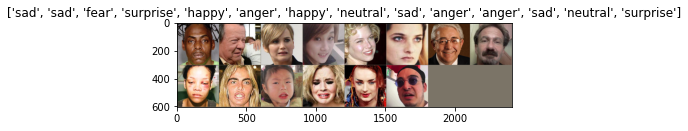

In [9]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated
# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))
# Make a grid from batch
out = torchvision.utils.make_grid(inputs[:14])
imshow(out,title=[class_names[x] for x in classes[:14]])

In [10]:
from copy import deepcopy
train_loader = dataloaders['train']

def train_and_check(model, loss_func, optim, epochs=15):
  '''
  Function to train and check results
  Parameters:
    :param model: model to train
    :param loss_func: loss function
    :param optim: optimizer for gradients
    :param epochs: number of epochs to train (default=15)
  Returns:
    model(last model): trained model with best accuracy
    history: list containing avg train loss and accuracy
  '''
  model.train()
  history = []
  for epoch in range(epochs):
    last_model = deepcopy(model)
    print(f"Epoch {epoch + 1}/{epochs}")


    train_loss = 0.
    # train_acc = 0.
    for i, (inputs, labels) in enumerate(train_loader):
      if i % 50 == 0:
        print(i)

      inputs, labels = inputs.to('cuda:0'), labels.to('cuda:0')

      optim.zero_grad()
      outputs = model(inputs)
      loss = loss_func(outputs, labels)
      loss.backward()
      optim.step()

      train_loss += loss.item() * inputs.size(0)
      # _, preds = torch.max(outputs.data, dim=1)
      # corects = preds.eq(labels.data.view_as(preds))
      # acc = torch.mean(corects.type(torch.FloatTensor))
      # train_acc += acc.item() * inputs.size(0)
    
    avg_train_loss = train_loss / len(image_datasets['train']) 
    print(avg_train_loss)
      # avg_train_acc = train_acc / len(image_datasets['train'])
    history.append(avg_train_loss)
    if epoch >= 1:
      if avg_train_loss > history[-2]:
        return last_model, history
    
  return model, history



# Creating Inception model

In [11]:
inception_model = models.inception_v3(pretrained=True)

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

In [12]:
inception_model.aux_logits = False

for param in inception_model.parameters():
    param.requires_grad = False

In [13]:
inception_model

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [14]:
inception_model.fc = nn.Sequential(nn.Linear(2048, 128), nn.ReLU(), nn.Linear(128, len(class_names)), nn.LogSoftmax(dim=1))

In [15]:
inception_model

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [16]:
inception_model.to('cuda:0')

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [17]:
summary(inception_model, (3, 299, 299))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 149, 149]             864
       BatchNorm2d-2         [-1, 32, 149, 149]              64
       BasicConv2d-3         [-1, 32, 149, 149]               0
            Conv2d-4         [-1, 32, 147, 147]           9,216
       BatchNorm2d-5         [-1, 32, 147, 147]              64
       BasicConv2d-6         [-1, 32, 147, 147]               0
            Conv2d-7         [-1, 64, 147, 147]          18,432
       BatchNorm2d-8         [-1, 64, 147, 147]             128
       BasicConv2d-9         [-1, 64, 147, 147]               0
        MaxPool2d-10           [-1, 64, 73, 73]               0
           Conv2d-11           [-1, 80, 73, 73]           5,120
      BatchNorm2d-12           [-1, 80, 73, 73]             160
      BasicConv2d-13           [-1, 80, 73, 73]               0
           Conv2d-14          [-1, 192,

In [18]:
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, inception_model.parameters()), lr=0.001)

In [19]:
inception_model_trained, inception_history = train_and_check(inception_model, loss_fn, optimizer, 5)

Epoch 1/5


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


0
50
100
150
200
250
300
350
400
450
500
550
1.9397445941159936
Epoch 2/5
0
50
100
150
200
250
300
350
400
450
500
550
1.8695610892651093
Epoch 3/5
0
50
100
150
200
250
300
350
400
450
500
550
1.855463149804515
Epoch 4/5
0
50
100
150
200
250
300
350
400
450
500
550
1.8385683764402672
Epoch 5/5
0
50
100
150
200
250
300
350
400
450
500
550
1.832563408083996


In [20]:
inception_model_trained.to('cuda:0')

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [21]:
def predict(model, dataloader):
  all_preds = torch.tensor([]).to('cuda:0')
  true_vals = torch.tensor([]).to('cuda:0')
  with torch.no_grad():
    model.eval()
    for i, (X, y) in enumerate(dataloader):
      if i % 10 == 0:
        print(i)
      X, y = X.to('cuda:0'), y.to('cuda:0')
      all_preds = torch.cat((all_preds, model(X)), 0)
      true_vals = torch.cat((true_vals, y), 0)
  return all_preds, true_vals

In [22]:
outputs, labels = predict(inception_model_trained, dataloaders['val'])

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


0
10
20
30
40
50
60


# Inception model report

In [23]:
print('Classification report for Inception model\n\n')
_, outs = torch.max(outputs, dim=1)
print(classification_report(labels.cpu().numpy(), outs.cpu().numpy(), target_names=class_names))
print('Confusion matrix for Inception model\n\n')
print(confusion_matrix(labels.cpu().numpy(), outs.cpu().numpy(), normalize='true'))

Classification report for Inception model


              precision    recall  f1-score   support

       anger       0.22      0.58      0.32       500
    contempt       0.36      0.07      0.12       500
     disgust       0.25      0.09      0.14       500
        fear       0.51      0.26      0.34       500
       happy       0.48      0.40      0.43       500
     neutral       0.27      0.49      0.34       500
         sad       0.26      0.19      0.22       500
    surprise       0.35      0.29      0.32       500

    accuracy                           0.30      4000
   macro avg       0.34      0.30      0.28      4000
weighted avg       0.34      0.30      0.28      4000

Confusion matrix for Inception model


[[0.576 0.016 0.062 0.03  0.052 0.158 0.052 0.054]
 [0.334 0.072 0.036 0.    0.12  0.34  0.072 0.026]
 [0.436 0.022 0.094 0.034 0.084 0.15  0.112 0.068]
 [0.214 0.    0.024 0.26  0.044 0.112 0.122 0.224]
 [0.218 0.04  0.062 0.016 0.398 0.162 0.056 0.048]
 [0.264 0.0

In [24]:
def plot_roc_curves(fpr_tpr, roc_auc):
  colors = ['blue', 'yellow', 'green', 'pink', 'orange', 'black', 'purple', 'olive']
  plt.title('Receiver Operating Characteristic')
  for i in range(8):
    plt.plot(fpr_tpr[i][0], fpr_tpr[i][1], colors[i], label = 'ROC curve for class %i AUC = %0.2f' %(i, roc_auc[i]))
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

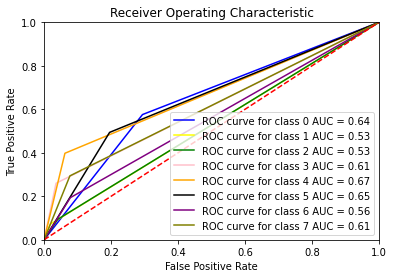

In [25]:
_, outs = torch.max(outputs, dim=1)
labels_plot = [(labels.cpu().numpy() == i).astype(float) for i in range(8)]
outs_plot = [(outs.cpu().numpy() == i).astype(float) for i in range(8)]

fpr_tpr = [roc_curve(labels_plot[i], outs_plot[i]) for i in range(8)]
roc_auc = [auc(fpr_tpr[i][0], fpr_tpr[i][1]) for i in range(8)]

plot_roc_curves(fpr_tpr, roc_auc)

# Visualizing Inception model prediction

In [26]:
X, y = next(iter(dataloaders['val']))
X = X.to('cuda:0')

probas = inception_model_trained(X)

_, preds = torch.max(probas, dim=1)


def show(images, labels, predicts):
  fig = plt.figure(figsize=(16,12), dpi=1600)
  axes = []
  k = 0
  for i in range(3):
    for j in range(4):
      axes.append(plt.subplot2grid((3, 4), (i, j)))
      inp = images[k]
      inp = inp.numpy().transpose((1, 2, 0))
      mean = np.array([0.485, 0.456, 0.406])
      std = np.array([0.229, 0.224, 0.225])
      inp = std * inp + mean
      inp = np.clip(inp, 0, 1)
      axes[k].set_ylabel(labels[k])
      axes[k].set_xlabel(predicts[k])
      axes[k].set_xticks([])
      axes[k].set_yticks([])
      plt.imshow(inp)
      k += 1
  plt.show()
y = [class_names[x] for x in y[:12]]
preds = [class_names[x] for x in preds[:12]]
show(X.to('cpu')[:12], y, preds)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


# Resnet model

In [27]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'drive/MyDrive/emotions_ds'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x + "_class"),
                                          data_transforms[x])
                  for x in ['train', 'val']}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=64,
                                             shuffle=True, num_workers=8)
              for x in ['train', 'val']}

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [28]:
resnet_model = models.resnet152(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth


  0%|          | 0.00/230M [00:00<?, ?B/s]

In [29]:
resnet_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [30]:
for param in resnet_model.parameters():
  param.requires_grad = False

In [31]:
resnet_model.fc = nn.Sequential(nn.Linear(2048, 128), nn.ReLU(), nn.Linear(128, len(class_names)), nn.LogSoftmax(dim=1))

In [32]:
resnet_model.to('cuda:0')

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [33]:
summary(resnet_model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [34]:
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_model.parameters()), lr=0.001)

In [35]:
resnet_model_trained, resnet_history = train_and_check(resnet_model, loss_fn, optimizer, 5)

Epoch 1/5


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


0
50
100
150
200
250
300
350
400
450
500
550
1.8974164908181093
Epoch 2/5
0
50
100
150
200
250
300
350
400
450
500
550
1.7907321948590929
Epoch 3/5
0
50
100
150
200
250
300
350
400
450
500
550
1.7527555521771336
Epoch 4/5
0
50
100
150
200
250
300
350
400
450
500
550
1.7421836065102603
Epoch 5/5
0
50
100
150
200
250
300
350
400
450
500
550
1.7254387090118088


In [36]:
resnet_model_trained.to('cuda:0')

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [37]:
resnet_outputs, labels = predict(resnet_model_trained, dataloaders['val'])
_, res_outs = torch.max(resnet_outputs, dim=1)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


0
10
20
30
40
50
60


# Resnet model report

In [38]:
print('Classification report for Resnet model\n\n')
_, outs = torch.max(outputs, dim=1)
print(classification_report(labels.cpu().numpy(), outs.cpu().numpy(), target_names=class_names))
print('Confusion matrix for Resnet model\n\n')
print(confusion_matrix(labels.cpu().numpy(), outs.cpu().numpy(), normalize='true'))

Classification report for Resnet model


              precision    recall  f1-score   support

       anger       0.13      0.34      0.18       500
    contempt       0.11      0.02      0.04       500
     disgust       0.11      0.04      0.06       500
        fear       0.13      0.07      0.09       500
       happy       0.10      0.08      0.09       500
     neutral       0.12      0.23      0.16       500
         sad       0.14      0.11      0.12       500
    surprise       0.12      0.10      0.11       500

    accuracy                           0.12      4000
   macro avg       0.12      0.12      0.11      4000
weighted avg       0.12      0.12      0.11      4000

Confusion matrix for Resnet model


[[0.336 0.016 0.048 0.076 0.1   0.228 0.102 0.094]
 [0.332 0.022 0.048 0.05  0.098 0.252 0.086 0.112]
 [0.318 0.042 0.04  0.066 0.108 0.228 0.078 0.12 ]
 [0.294 0.034 0.048 0.068 0.124 0.222 0.118 0.092]
 [0.354 0.02  0.044 0.068 0.084 0.246 0.078 0.106]
 [0.304 0.026 0.0

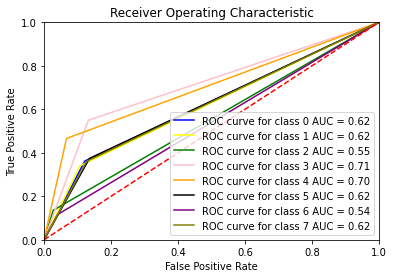

In [39]:
labels_plot = [(labels.cpu().numpy() == i).astype(float) for i in range(8)]
outs_plot = [(res_outs.cpu().numpy() == i).astype(float) for i in range(8)]

fpr_tpr = [roc_curve(labels_plot[i], outs_plot[i]) for i in range(8)]
roc_auc = [auc(fpr_tpr[i][0], fpr_tpr[i][1]) for i in range(8)]

plot_roc_curves(fpr_tpr, roc_auc)

# Visualizing Resnet model predictions

In [40]:
res_probas = inception_model_trained(X)
_, res_preds = torch.max(probas, dim=1)
res_preds = [class_names[x] for x in res_preds[:12]]

show(X.to('cpu')[:12], y, res_preds)

# Summary

Results we got from both models were pretty bad. This happened not because some models issues, but because data issues. Some photos were probably missmatched (for example image0000008 marked as 'happy' but face expression is neutral). All photos have different background, size(we resized photos to train model, but it cause loosing some features in face expresiions) etc. To get better result we should probably train models at more standartized data with more expressed emotions.



